# Lending Tree Loan Status
## Classification: lightGBM GPU
### Optuna HPO: 1000 Trials 3-fold Cross Validation

## Set Up Environment & Read Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna


In [ ]:
# Clone lightGBM
!git clone --recursive https://github.com/Microsoft/LightGBM

Cloning into 'LightGBM'...
remote: Enumerating objects: 27692, done.
remote: Counting objects: 100% (290/290), done.
remote: Compressing objects: 100% (198/198), done.
remote: Total 27692 (delta 146), reused 191 (delta 87), pack-reused 27402
Receiving objects: 100% (27692/27692), 19.87 MiB | 6.39 MiB/s, done.
Resolving deltas: 100% (20449/20449), done.
Checking out files: 100% (524/524), done.
Submodule 'include/boost/compute' (https://github.com/boostorg/compute) registered for path 'external_libs/compute'
Submodule 'eigen' (https://gitlab.com/libeigen/eigen.git) registered for path 'external_libs/eigen'
Submodule 'external_libs/fast_double_parser' (https://github.com/lemire/fast_double_parser.git) registered for path 'external_libs/fast_double_parser'
Submodule 'external_libs/fmt' (https://github.com/fmtlib/fmt.git) registered for path 'external_libs/fmt'
Cloning into '/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/LightGBM/external_libs/compute'...
remote: Enumer

In [ ]:
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/LightGBM

!mkdir build

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/LightGBM
mkdir: cannot create directory ‘build’: File exists


In [ ]:
# Compile
!cmake -DUSE_GPU=1
!make -j$(nproc)

CMake Warning:
  No source or binary directory provided.  Both will be assumed to be the
  same as the current working directory, but note that this warning will
  become a fatal error in future CMake releases.


-- OpenCL include directory: /usr/include
-- Using _mm_prefetch
-- Using _mm_malloc
-- Configuring done
-- Generating done
-- Build files have been written to: /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/LightGBM
Consolidate compiler generated dependencies of target lightgbm_capi_objs
[ -1%] Built target lightgbm_capi_objs
Consolidate compiler generated dependencies of target lightgbm_objs
[ 88%] Built target lightgbm_objs
[ 90%] Built target _lightgbm
Consolidate compiler generated dependencies of target lightgbm
[ 96%] Built target lightgbm


In [ ]:
# Install pip and packages
!sudo apt-get -y install python-pip
!sudo -H pip install setuptools optuna plotly eli5 shap lime -U

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  libpython-all-dev python-all python-all-dev python-asn1crypto
  python-cffi-backend python-crypto python-cryptography python-dbus
  python-enum34 python-gi python-idna python-ipaddress python-keyring
  python-keyrings.alt python-pip-whl python-pkg-resources python-secretstorage
  python-setuptools python-six python-wheel python-xdg
Suggested packages:
  python-crypto-doc python-cryptography-doc python-cryptography-vectors
  python-dbus-dbg python-dbus-doc python-enum34-doc python-gi-cairo
  gnome-keyring libkf5wallet-bin gir1.2-gnomekeyring-1.0 python-fs
  python-gdata python-keyczar python-secretstorage-doc python-setuptools-doc
The following NEW packages will be installed:
  libpython-all-dev pytho

In [ ]:
# Compile for GPU
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/LightGBM/python-package

!sudo python3 setup.py install --precompile --gpu

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/LightGBM/python-package
running install
/usr/local/lib/python3.7/dist-packages/setuptools/command/install.py:37: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  setuptools.SetuptoolsDeprecationWarning,
running build
running build_py
running egg_info
writing lightgbm.egg-info/PKG-INFO
writing dependency_links to lightgbm.egg-info/dependency_links.txt
writing requirements to lightgbm.egg-info/requires.txt
writing top-level names to lightgbm.egg-info/top_level.txt
reading manifest template 'MANIFEST.in'
no previously-included directories found matching 'build'
writing manifest file 'lightgbm.egg-info/SOURCES.txt'
copying lightgbm/VERSION.txt -> build/lib/lightgbm
running install_lib
creating /usr/lib/python3.7/site-packages
creating /usr/lib/python3.7/site-packages/lightgbm
copying build/lib/lightgbm/plotting.py -> /usr/lib/python3.7/site-packages/lightgbm


In [ ]:
import os
import random
import numpy as np
import warnings
import pandas as pd
from sklearn.model_selection import cross_val_score, KFold
import lightgbm as lgb
from lightgbm import LGBMClassifier
import optuna
from optuna import Trial
optuna.logging.set_verbosity(optuna.logging.WARNING)
from optuna.integration import LightGBMPruningCallback
from datetime import datetime, timedelta
from timeit import default_timer as timer
import time
import pickle
import joblib
from sklearn.metrics import log_loss, f1_score, roc_auc_score, accuracy_score
from sklearn.metrics import recall_score, precision_score
from sklearn.metrics import classification_report, confusion_matrix
import plotly.offline as py
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import eli5
from eli5.sklearn import PermutationImportance
import webbrowser
from eli5.formatters import format_as_dataframe
from lime import lime_tabular
warnings.filterwarnings('ignore')
my_dpi = 96
!/usr/local/cuda/bin/nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
Wed Nov  9 04:35:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |      

In [ ]:
# Set seed
seed_value = 42
os.environ['lgb_GPU'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)

# SMOTE

In [ ]:
%cd /content/drive/MyDrive/LoanStatus/Data/

/content/drive/MyDrive/LoanStatus/Data


In [ ]:
# Read data
trainDF = pd.read_csv('trainDF_SMOTE.csv', low_memory=False)
testDF = pd.read_csv('testDF_SMOTE.csv', low_memory=False)

# Make train/test sets
X_train = trainDF.drop('loan_status', axis=1)
y_train = trainDF.loan_status
X_test = testDF.drop('loan_status', axis=1)
y_test = testDF.loan_status

# Define label and features
label = trainDF[['loan_status']]

# Remove target
features = trainDF.drop(columns = ['loan_status'])

# Extract feature names
feature_names = list(features.columns)
features = features.columns
features = np.array(features)

## Baseline Model

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Set the baseline model for Upsampling
lgbc = lgb.LGBMClassifier(boosting_type='gbdt',
                          device='gpu',
                          gpu_platform_id=0,
                          gpu_device_id=0,
                          verbosity=-1)

# Fit the model to the data
lgbc.fit(X_train, y_train)

# Save model
Pkl_Filename = 'lightGBM_Upsampling_Baseline.pkl'

with open(Pkl_Filename, 'wb') as file:
    pickle.dump(lgbc, file)

print('\nModel Metrics for LightGBM Baseline Upsampling')
# Predict based on training
y_train_pred = lgbc.predict(X_train)
y_test_pred = lgbc.predict(X_test)

print('Training Set')
print('Classification Report:')
clf_rpt = classification_report(y_train, y_train_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_train, y_train_pred))
print('\n')
print('Accuracy score : %.3f' % accuracy_score(y_train, y_train_pred))
print('Precision score : %.3f' % precision_score(y_train), y_train_pred))
print('Recall score : %.3f' % recall_score(y_train, y_train_pred))
print('F1 score : %.3f' % f1_score(y_train, y_train_pred))

print('\n')
print('Test Set')
print('Classification Report:')
clf_rpt = classification_report(y_test, y_test_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test, y_test_pred))
print('\n')
print('Accuracy score : %.3f' % accuracy_score(y_test, y_test_pred))
print('Precision score : %.3f' % precision_score(y_test), y_test_pred))
print('Recall score : %.3f' % recall_score(y_test), y_test_pred))
print('F1 score : %.3f' % f1_score(y_test, y_test_pred))


Model Metrics for LightGBM Baseline Upsampling
Training Set
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96   1511066
           1       0.99      0.93      0.96   1511066

    accuracy                           0.96   3022132
   macro avg       0.96      0.96      0.96   3022132
weighted avg       0.96      0.96      0.96   3022132



Confusion matrix:
[[1495328   15738]
 [ 111369 1399697]]


Accuracy score : 0.958
Precision score : 0.989
Recall score : 0.926
F1 score : 0.957


Test Set
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    377848
           1       0.93      0.93      0.93     54625

    accuracy                           0.98    432473
   macro avg       0.96      0.96      0.96    432473
weighted avg       0.98      0.98      0.98    432473



Confusion matrix:
[[373836   4012]
 [  3986  50639]]


Accuracy score : 0.982
Pr

## 1000 Trials 5-fold Cross Validation

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define a function for optimization of hyperparameters
def objective(trial):

    joblib.dump(study, 'lightGBM_GPU_HPO_SMOTE_Optuna_1000.pkl')

    params_lgb_optuna = {
        'random_state': seed_value,
        'device_type': 'gpu',
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'n_estimators': trial.suggest_int('n_estimators', 100, 500, step=10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-6, 1e-1),
        'num_leaves': trial.suggest_int('num_leaves', 100, 1000, step=20),
        'bagging_freq': trial.suggest_int('bagging_freq', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 0.95),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 0.9),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 1e-1, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 1e-1,  log=True),
        'min_gain_to_split': trial.suggest_float('min_gain_to_split', 1, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 100, 500,
                                               step=10),
        'verbosity': -1}

    # Set same k-folds for reproducibility
    kf = KFold(n_splits=5, shuffle=True, random_state=seed_value)

    # Set up train and validation sets
    for idx, (trn_idx, val_idx) in enumerate(kf.split(trainDF[features], label)):
        train_features, train_label = trainDF[features].iloc[trn_idx], label.iloc[trn_idx]
        val_features, val_label = trainDF[features].iloc[val_idx], label.iloc[val_idx]

      # Start timer for each trial
      start = timer()
      model = lgb.LGBMClassifier(**params_lgb_optuna, early_stopping_rounds=150)

      # Set up scores
      cv_scores = np.empty(5)

      # Train the model
      model.fit(train_features, train_label.values.ravel(),
                eval_set = [(val_features, val_label.values.ravel())],
                eval_metric='binary_logloss',
                callbacks=[LightGBMPruningCallback(trial, 'binary_logloss')])

      # Predictions
      y_pred_val = model.predict_proba(val_features)
      cv_scores[idx] = log_loss(val_label, y_pred_val)
      print('- Validation logloss:', np.mean(cv_scores))
      run_time = timer() - start

      return np.mean(cv_scores)

In [ ]:
# Begin HPO trials
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('lightGBM_GPU_HPO_SMOTE_Optuna_1000.pkl'):
    study = joblib.load('lightGBM_GPU_HPO_SMOTE_Optuna_1000.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest LogLoss', study.best_value)

Start Time           2022-04-08 04:59:40.067174
[LightGBM] [Warning] lambda_l2 is set=0.002652449623151601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002652449623151601
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] early_stopping_round is set=150, early_stopping_rounds=150 will be ignored. Current value: early_stopping_round=150
[LightGBM] [Warning] lambda_l1 is set=7.579987626464909e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.579987626464909e-06
[LightGBM] [Warning] min_gain_to_split is set=5.574861298675633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.574861298675633
- Validation logloss: 0.16997527673956503
- Validation logloss: 0.10557545672177608
- Validation logloss: 0.16740697114876996
- Validation logloss: 0.1697333060836038
- Validation logloss: 0.17026991779791317
- Validation logloss: 0.13208024714742872
- Validation logloss: 0.145

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/trialOptions/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'logloss'}, inplace=True)
trials_df.rename(columns={'params_bagging_freq': 'bagging_freq'}, inplace=True)
trials_df.rename(columns={'params_colsample_bytree': 'colsample_bytree'},
                 inplace=True)
trials_df.rename(columns={'params_lambda_l1': 'lambda_l1'}, inplace=True)
trials_df.rename(columns={'params_lambda_l2': 'lambda_l2'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_min_child_samples': 'min_child_samples'},
                 inplace=True)
trials_df.rename(columns={'params_min_gain_to_split': 'min_gain_to_split'},
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_num_leaves': 'num_leaves'}, inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('logloss', ascending=True)

# Write processed data to csv
trials_df.to_csv('lightGBM_SMOTE_Optuna_GPU_1000.csv', index=False)
print(trials_df)

     iteration     logloss             datetime_start  \
598        598    0.092395 2022-04-08 08:24:19.762493   
889        889    0.092416 2022-04-08 09:30:48.338655   
651        651    0.092425 2022-04-08 08:35:18.331681   
535        535    0.092430 2022-04-08 08:10:59.355493   
472        472    0.092433 2022-04-08 07:53:53.453169   
..         ...         ...                        ...   
11          11  229.110890 2022-04-08 05:07:47.872529   
13          13  229.114920 2022-04-08 05:09:02.613496   
41          41  278.096703 2022-04-08 05:22:25.536570   
46          46  278.099300 2022-04-08 05:24:19.341644   
44          44  278.099655 2022-04-08 05:23:31.061596   

             datetime_complete               duration  bagging_freq  \
598 2022-04-08 08:24:58.737481 0 days 00:00:38.974988             7   
889 2022-04-08 09:31:31.652790 0 days 00:00:43.314135             5   
651 2022-04-08 08:36:00.010968 0 days 00:00:41.679287             7   
535 2022-04-08 08:11:33.161178 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_lightGBM_Optuna_1000.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_lightGBM_SMOTE_Optuna_1000.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search.
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_lightGBM_SMOTE_Optuna_1000.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['num_leaves',
                                                       'max_depth',
                                                       'subsample',
                                                       'learning_rate',
                                                       'subsample'])
py.plot(fig, filename='contour_lightGBM_SMOTE_Optuna_1000.html')
fig.show()

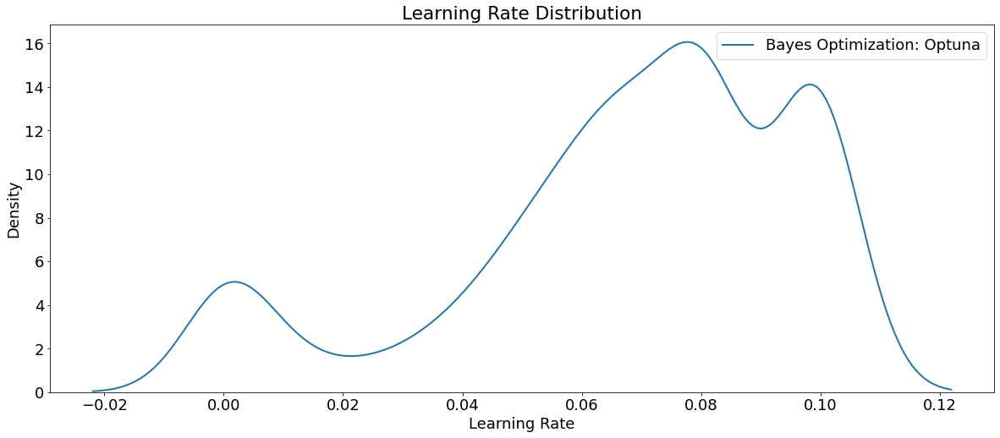

In [ ]:
# Density plots of the learning rate distributions
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna',
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); plt.title('Learning Rate Distribution');
plt.show()

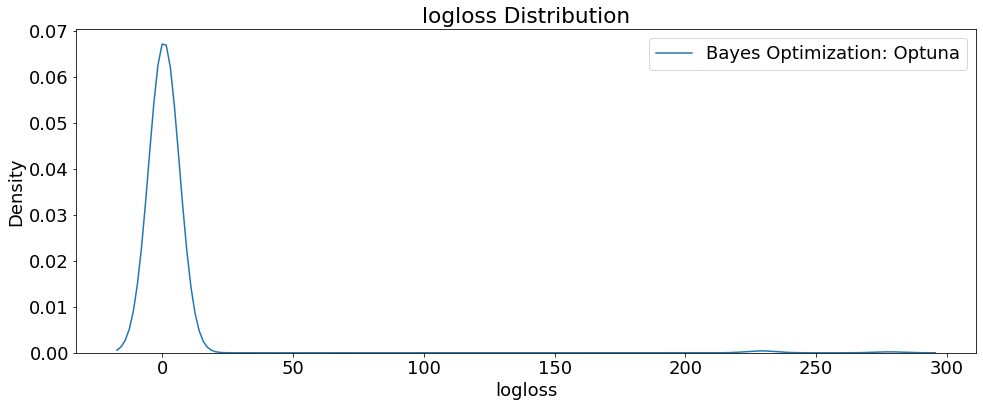

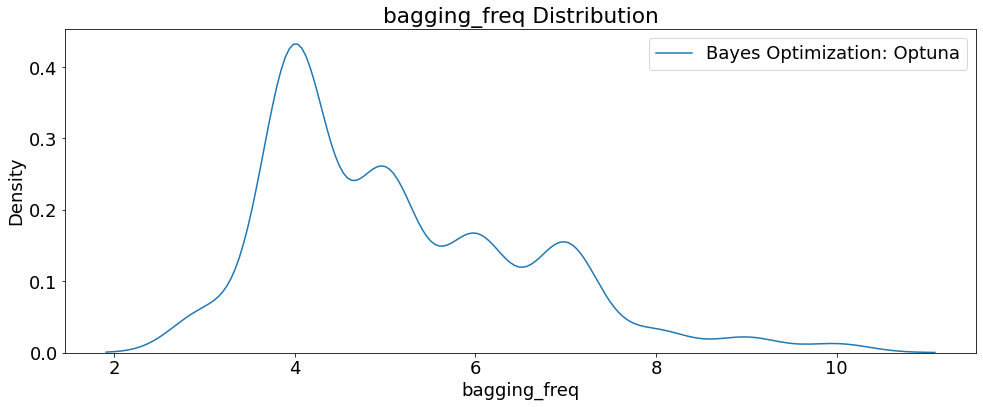

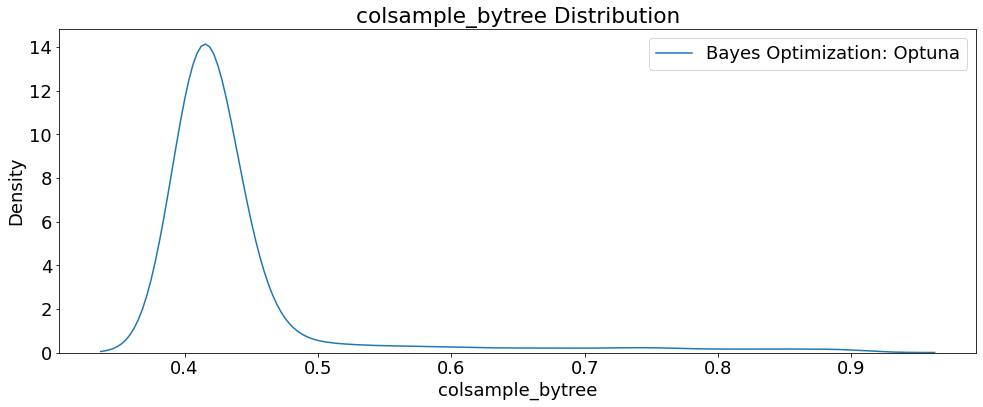

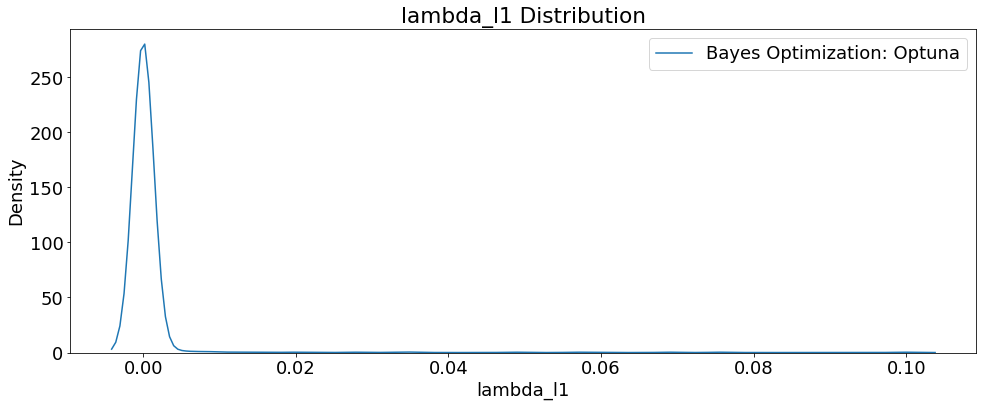

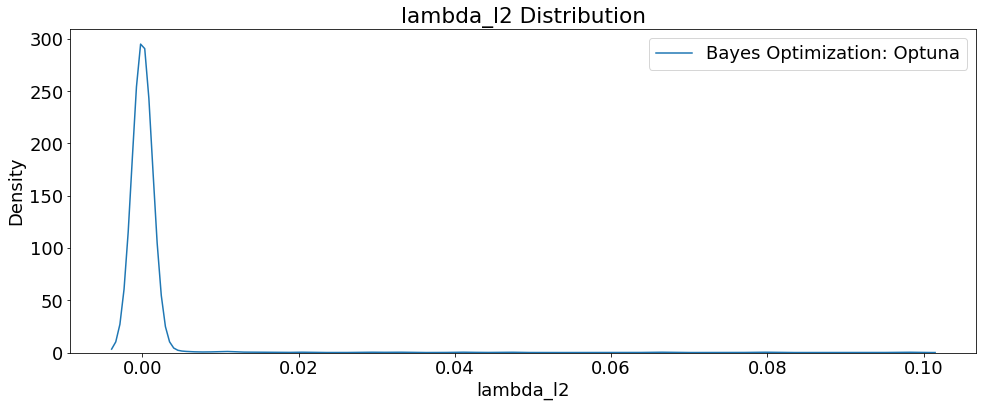

...

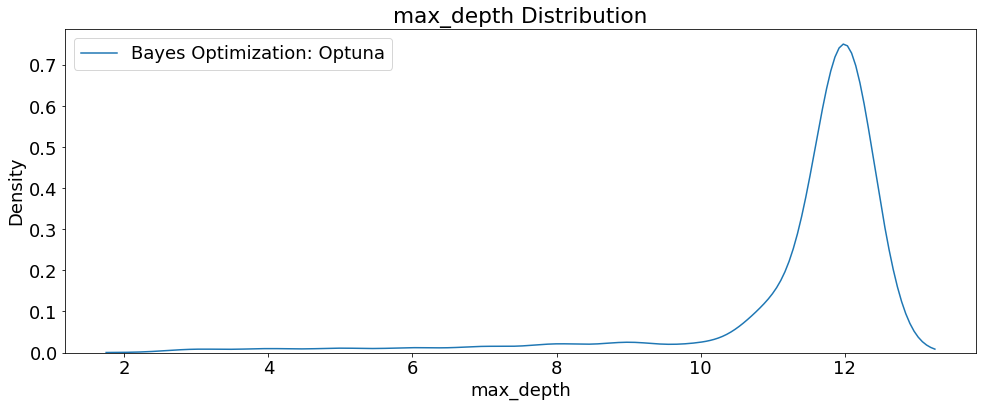

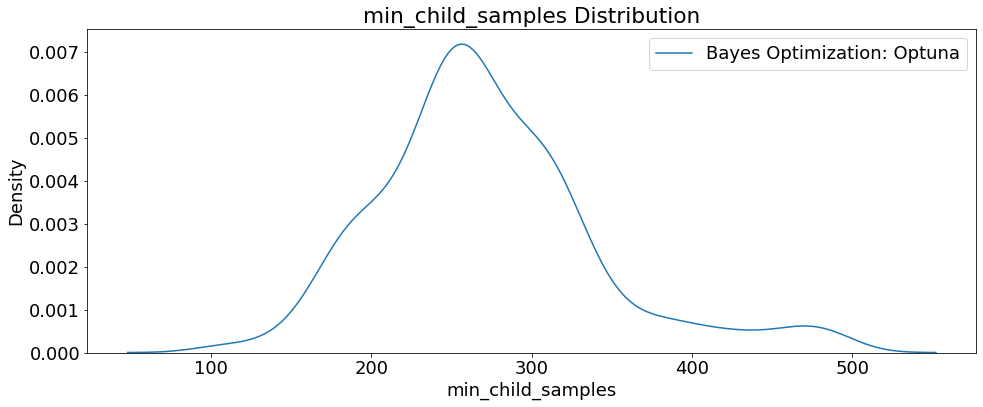

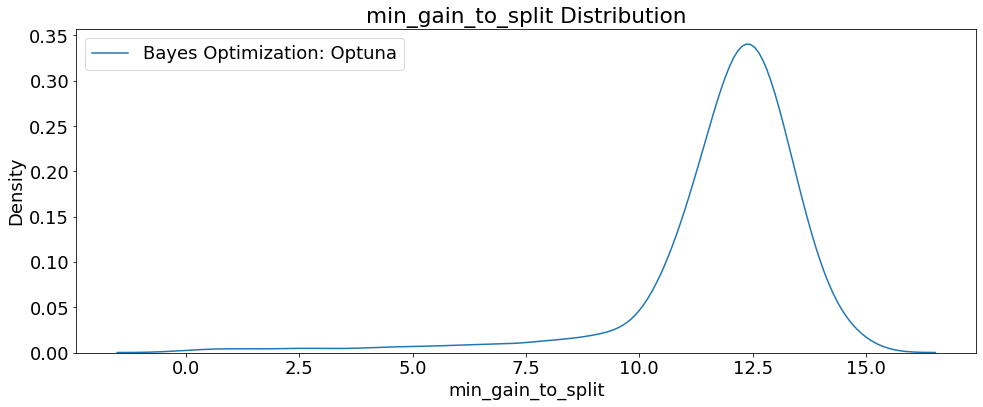

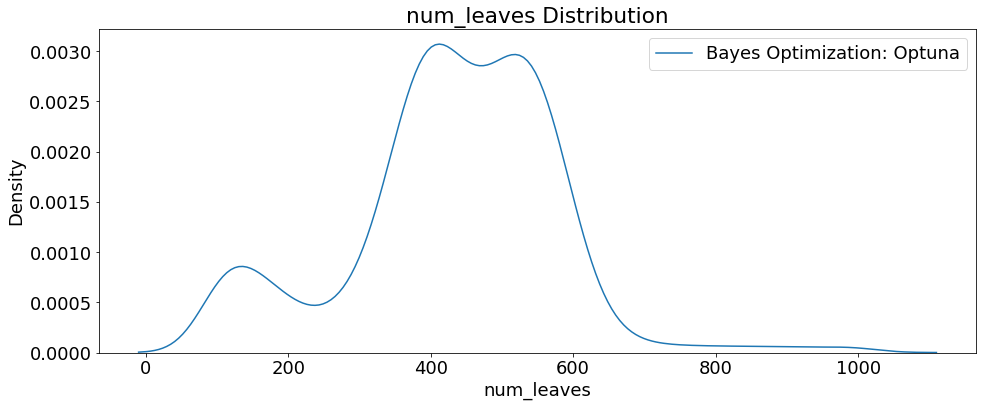

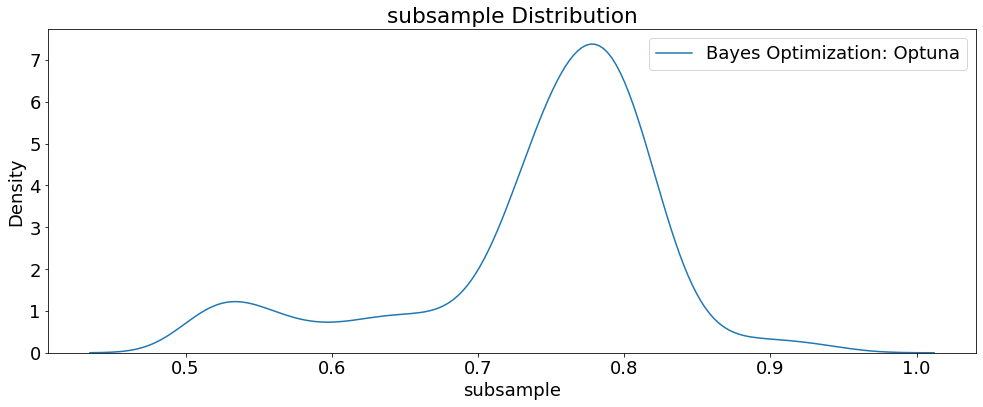

In [ ]:
# Create plots of Hyperparameters that are numeric
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration', 'n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

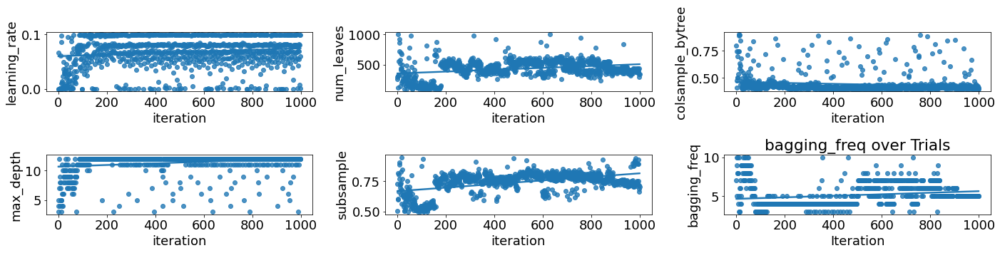

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(2, 3, figsize=(20,5))
i = 0
for i, hpo in enumerate(['learning_rate', 'num_leaves', 'colsample_bytree',
                         'max_depth', 'subsample', 'bagging_freq']):
    # Scatterplot
    sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
    axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),
               title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

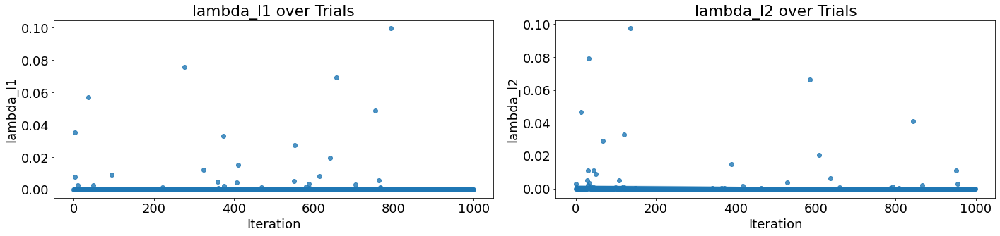

In [ ]:
# Scatterplot of regularization hyperparameters)
fig, axs = plt.subplots(1, 2, figsize=(20,5))
i = 0
for i, hpo in enumerate(['lambda_l1', 'lambda_l2']):
    # Scatterplot
    sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
    axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),
               title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_lightGBM_GPU_HPO_SMOTE_Optuna_1000.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_lightGBM_GPU_HPO_SMOTE_Optuna_1000.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params
params['random_state'] = seed_value
params['metric'] = 'binary_error'
params

{'n_estimators': 170,
 'learning_rate': 0.09981693737153056,
 'num_leaves': 320,
 'bagging_freq': 7,
 'subsample': 0.6623669608159025,
 'colsample_bytree': 0.40828008982810615,
 'max_depth': 12,
 'lambda_l1': 6.296534376034453e-07,
 'lambda_l2': 2.223229202863544e-07,
 'min_gain_to_split': 13.413959754649742,
 'min_child_samples': 230,
 'random_state': 42,
 'metric': 'binary_error'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define label and features
train_label = trainDF[['loan_status']]

# Remove target
train_features = trainDF.drop(columns = ['loan_status'])

# Create test features
test_features = testDF.drop(columns = ['loan_status'])

In [ ]:
# Re-create the best model and train on the training data
best_model = lgb.LGBMClassifier(boosting_type='gbdt',
                                device='gpu',
                                gpu_platform_id=0,
                                gpu_device_id=0,
                                verbosity=-1,
                                **params)

# Fit the model
best_model.fit(train_features, train_label.values.ravel())

# Save model
Pkl_Filename = 'lightGBM_HPO_Optuna_SMOTE_trials1000_GPU.pkl'

with open(Pkl_Filename, 'wb') as file:
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('lightGBM_HPO_Optuna_SMOTE_trials1000_GPU.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for lightGBM HPO SMOTE 1000 GPU trials')
# Predict based on training
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)
print('\n')
print('Classification Report: Train')
clf_rpt = classification_report(y_train, y_train_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix: Train')
print(confusion_matrix(y_train, y_train_pred))
print('\n')
print('Classification Report: Test')
clf_rpt = classification_report(y_test, y_test_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix: Test')
print(confusion_matrix(y_test, y_test_pred))
print('\n')
print('Accuracy score: train: %.3f, test: %.3f' % (
        accuracy_score(y_train, y_train_pred),
        accuracy_score(y_test, y_test_pred)))
print('Precision score: train: %.3f, test: %.3f' % (
        precision_score(y_train, y_train_pred),
        precision_score(y_test, y_test_pred)))
print('Recall score: train: %.3f, test: %.3f' % (
        recall_score(y_train, y_train_pred),
        recall_score(y_test, y_test_pred)))
print('F1 score: train: %.3f, test: %.3f' % (
        f1_score(y_train, y_train_pred),
        f1_score(y_test, y_test_pred)))


Model Metrics for lightGBM HPO SMOTE 1000 GPU trials


Classification Report: Train
              precision    recall  f1-score   support

           0       0.98      1.00      0.99   1511066
           1       1.00      0.98      0.99   1511066

    accuracy                           0.99   3022132
   macro avg       0.99      0.99      0.99   3022132
weighted avg       0.99      0.99      0.99   3022132



Confusion matrix: Train
[[1510709     357]
 [  23283 1487783]]


Classification Report: Test
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    377848
           1       1.00      0.90      0.95     54625

    accuracy                           0.99    432473
   macro avg       0.99      0.95      0.97    432473
weighted avg       0.99      0.99      0.99    432473



Confusion matrix: Test
[[377731    117]
 [  5563  49062]]


Accuracy score: train: 0.992, test: 0.987
Precision score: train: 1.000, test: 0.998
Recall score: train

In [ ]:
# Evaluate on the testing data
print('The best model from optimization scores {:.5f} Accuracy on the test set.'.format(accuracy_score(y_test,
                                                                                                       y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 0.98687 Accuracy on the test set.
This was achieved using these conditions:
iteration                                   598
logloss                                0.092395
datetime_start       2022-04-08 08:24:19.762493
datetime_complete    2022-04-08 08:24:58.737481
duration                 0 days 00:00:38.974988
bagging_freq                                  7
colsample_bytree                        0.40828
lambda_l1                              0.000001
lambda_l2                                   0.0
learning_rate                          0.099817
max_depth                                    12
min_child_samples                           230
min_gain_to_split                      13.41396
n_estimators                                170
num_leaves                                  320
subsample                              0.662367
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations


In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(train_features)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


<Figure size 432x288 with 0 Axes>

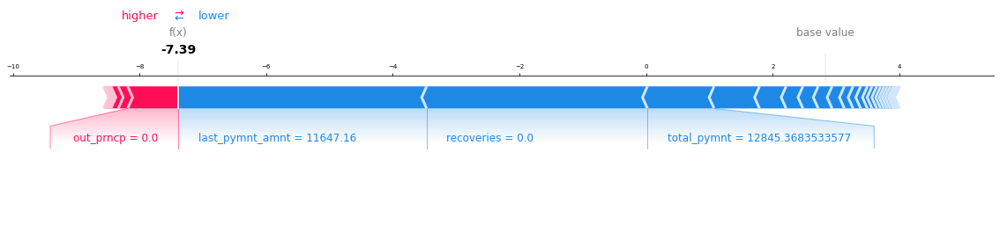

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 7})
fig = plt.figure()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], train_features.iloc[0,:],
                show=False, matplotlib=True).savefig('lightGBM_HPO_SMOTE_Optuna_1000_GPU_ShapForcePlot_TrainSet.png',
                                                     dpi=my_dpi*10,
                                                     bbox_inches='tight');

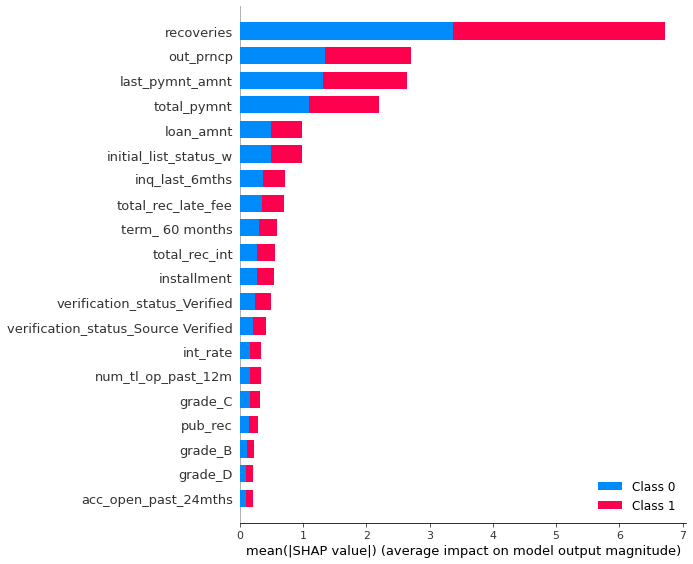

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('lightGBM_HPO_SMOTE_Optuna_1000_GPU_ShapSummary_TrainSet.png',
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


<Figure size 432x288 with 0 Axes>

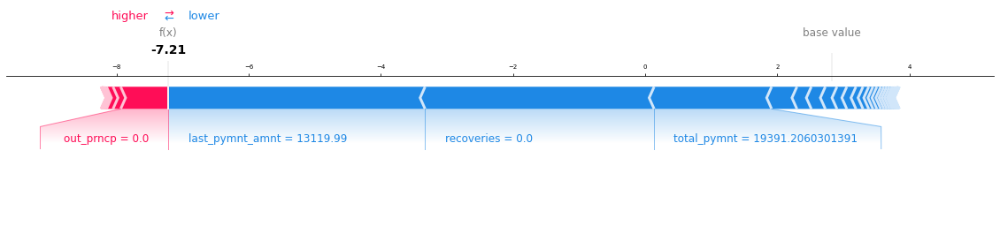

In [ ]:
# Visualize the first prediction's explanation
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], test_features.iloc[0,:],
                show=False, matplotlib=True).savefig('lightGBM_HPO_SMOTE_Optuna_1000_GPU_ShapForcePlot_TestSet.png',
                                                     dpi=my_dpi*10,
                                                     bbox_inches='tight');

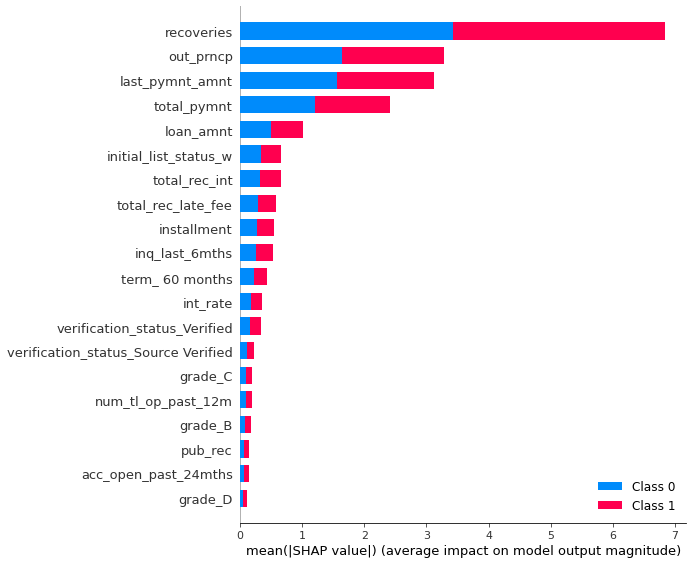

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('lightGBM_HPO_SMOTE_Optuna_1000_GPU_ShapSummary_TestSet.png',
            dpi=my_dpi*10, bbox_inches='tight')

In [ ]:
# Model metrics with Eli5
# Compute permutation feature importance
perm_importance = PermutationImportance(best_model,
                                        random_state=seed_value).fit(test_features,
                                                                     y_test)

[LightGBM] [Warning] lambda_l2 is set=2.223229202863544e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.223229202863544e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l1 is set=6.296534376034453e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.296534376034453e-07
[LightGBM] [Warning] min_gain_to_split is set=13.413959754649742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.413959754649742


In [ ]:
# Get the weights
X_test1 = pd.DataFrame(test_features, columns=test_features.columns)

# Store feature weights in an object
html_obj = eli5.show_weights(perm_importance,
                             feature_names=X_test1.columns.tolist())

# Write feature weights html object to a file
with open(r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_SMOTE_Optuna_1000_GPU_WeightsFeatures.htm',
          'wb') as f:
    f.write(html_obj.data.encode('UTF-8'))

# Open the stored feature weights HTML file
url = r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_SMOTE_Optuna_1000_GPU_WeightsFeatures.htm'
webbrowser.open(url, new=2)

html_obj

Weight,Feature
0.2236 ± 0.0010,out_prncp
0.0802 ± 0.0002,total_pymnt
0.0700 ± 0.0002,recoveries
0.0165 ± 0.0001,loan_amnt
0.0162 ± 0.0003,last_pymnt_amnt
0.0028 ± 0.0001,installment
0.0025 ± 0.0001,total_rec_int
0.0007 ± 0.0000,total_rec_late_fee
0.0003 ± 0.0000,term_ 60 months
0.0000 ± 0.0000,grade_B


In [ ]:
# Show prediction
html_obj2 = show_prediction(best_model, test_features.iloc[1],
                            show_feature_values=True)

# Write show prediction html object to a file
with open(r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_SMOTE_Optuna_1000_GPU_Prediction.htm',
          'wb') as f:
    f.write(html_obj2.data.encode('UTF-8'))

# Open the show prediction stored HTML file
url2 = r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_SMOTE_Optuna_1000_GPU_Prediction.htm'
webbrowser.open(url2, new=2)

html_obj2

In [ ]:
# Explain weights
explanation = eli5.explain_weights_sklearn(perm_importance,
                                           feature_names=X_test1.columns.tolist())
exp = format_as_dataframe(explanation)

# Write processed data to csv
exp.to_csv('best_bayes_SMOTE_Optuna_1000_GPU_WeightsExplain.csv', index=False)
exp

,feature,weight,std
0,out_prncp,2.235506e-01,0.000501
1,total_pymnt,8.015483e-02,0.000104
2,recoveries,6.999142e-02,0.000118
3,loan_amnt,1.653514e-02,0.000047
4,last_pymnt_amnt,1.620309e-02,0.000165
5,installment,2.760866e-03,0.000071
6,total_rec_int,2.526400e-03,0.000063
7,total_rec_late_fee,7.403930e-04,0.000015
8,term_ 60 months,3.112333e-04,0.000021
9,grade_B,3.283442e-05,0.000010


In [ ]:
# LIME for model explanations
X_train1 = pd.DataFrame(X_train, columns=trainDF.columns)

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train1.columns,
    class_names=['current', 'default'],
    mode='classification')

exp = explainer.explain_instance(
    data_row=X_train.iloc[1],
    predict_fn=best_model.predict_proba)
exp.save_to_file('best_bayes_SMOTE_Optuna_1000_GPU_LIME_Train.html')
exp.show_in_notebook()

In [ ]:
# LIME for model explanations
X_test1 = pd.DataFrame(X_test, columns=testDF.columns)

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_test),
    feature_names=X_test1.columns,
    class_names=['current', 'default'],
    mode='classification')

exp = explainer.explain_instance(
    data_row=X_test.iloc[1],
    predict_fn=best_model.predict_proba)
exp.save_to_file('best_bayes_SMOTE_Optuna_1000_GPU_LIME_Test.html')
exp.show_in_notebook()

# Upsampling

In [ ]:
%cd /content/drive/MyDrive/LoanStatus/Data/

/content/drive/MyDrive/LoanStatus/Data


In [ ]:
# Read data
trainDF = pd.read_csv('trainDF_US.csv', low_memory=False)
testDF = pd.read_csv('testDF_US.csv', low_memory=False)

X_train = trainDF.drop('loan_status', axis=1)
y_train = trainDF.loan_status
X_test = testDF.drop('loan_status', axis=1)
y_test = testDF.loan_status

# Define label and features
label = trainDF[['loan_status']]

# Remove target
features = trainDF.drop(columns = ['loan_status'])

# Extract feature names
feature_names = list(features.columns)
features = features.columns
features = np.array(features)

## Baseline Model

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Set the baseline model for SMOTE
lgbc = lgb.LGBMClassifier(boosting_type='gbdt',
                          device='gpu',
                          gpu_platform_id=0,
                          gpu_device_id=0,
                          verbosity=-1)

# Fit the model to the data
lgbc.fit(X_train, y_train)

# Save model
Pkl_Filename = 'lightGBM_SMOTE_Baseline.pkl'

with open(Pkl_Filename, 'wb') as file:
    pickle.dump(lgbc, file)

print('\nModel Metrics for LightGBM Baseline SMOTE')
# Predict based on training
y_train_pred = lgbc.predict(X_train)
y_test_pred = lgbc.predict(X_test)

print('Training Set')
print('Classification Report:')
clf_rpt = classification_report(y_train, y_train_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_train, y_train_pred))
print('\n')
print('Accuracy score : %.3f' % accuracy_score(y_train, y_train_pred))
print('Precision score : %.3f' % precision_score(y_train), y_train_pred))
print('Recall score : %.3f' % recall_score(y_train, y_train_pred))
print('F1 score : %.3f' % f1_score(y_train, y_train_pred))

print('\n')
print('Test Set')
print('Classification Report:')
clf_rpt = classification_report(y_test, y_test_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test, y_test_pred))
print('\n')
print('Accuracy score : %.3f' % accuracy_score(y_test, y_test_pred))
print('Precision score : %.3f' % precision_score(y_test), y_test_pred))
print('Recall score : %.3f' % recall_score(y_test), y_test_pred))
print('F1 score : %.3f' % f1_score(y_test, y_test_pred))


Model Metrics for LightGBM Baseline SMOTE
Training Set
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99   1511066
           1       1.00      0.98      0.99   1511066

    accuracy                           0.99   3022132
   macro avg       0.99      0.99      0.99   3022132
weighted avg       0.99      0.99      0.99   3022132



Confusion matrix:
[[1510899     167]
 [  24667 1486399]]


Accuracy score : 0.992
Precision score : 1.000
Recall score : 0.984
F1 score : 0.992


Test Set
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    377848
           1       1.00      0.89      0.94     54625

    accuracy                           0.99    432473
   macro avg       0.99      0.95      0.97    432473
weighted avg       0.99      0.99      0.99    432473



Confusion matrix:
[[377806     42]
 [  5741  48884]]


Accuracy score : 0.987
Precisi

## 1000 Trials 5-fold Cross Validation

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define a function for optimization of hyperparameters
def objective(trial):

    joblib.dump(study, 'lightGBM_US_Optuna_1000_GPU.pkl')

    params_lgb_optuna = {
        'random_state': seed_value,
        'device_type': 'gpu',
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'n_estimators': trial.suggest_int('n_estimators', 100, 500, step=10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-6, 1e-1),
        'num_leaves': trial.suggest_int('num_leaves', 100, 1000, step=20),
        'bagging_freq': trial.suggest_int('bagging_freq', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 0.95),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 0.9),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 1e-1, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 1e-1,  log=True),
        'min_gain_to_split': trial.suggest_float('min_gain_to_split', 1, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 100, 500,
                                               step=10),
        'verbosity': -1}

    # Set same k-folds for reproducibility
    kf = KFold(n_splits=5, shuffle=True, random_state=seed_value)

    # Set up train and validation sets
    for idx, (trn_idx, val_idx) in enumerate(kf.split(trainDF[features], label)):
        train_features, train_label = trainDF[features].iloc[trn_idx], label.iloc[trn_idx]
        val_features, val_label = trainDF[features].iloc[val_idx], label.iloc[val_idx]

      # Start timer for each trial
      start = timer()
      model = lgb.LGBMClassifier(**params_lgb_optuna, early_stopping_rounds=150)

      # Set up scores
      cv_scores = np.empty(5)

      # Train the model
      model.fit(train_features, train_label.values.ravel(),
                eval_set = [(val_features, val_label.values.ravel())],
                eval_metric='binary_logloss',
                callbacks=[LightGBMPruningCallback(trial, 'binary_logloss')])

      # Predictions
      y_pred_val = model.predict_proba(val_features)
      cv_scores[idx] = log_loss(val_label, y_pred_val)
      print('- Validation logloss:', np.mean(cv_scores))
      run_time = timer() - start

      return np.mean(cv_scores)

In [ ]:
# Begin HPO trials
# Start timer for experiment
search_time_start = time.time()
if os.path.isfile('lightGBM_US_Optuna_1000_GPU.pkl'):
    study = joblib.load('lightGBM_US_Optuna_1000_GPU.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000)

# End timer for experiment
print('Time to run HPO:', time.time() - search_time_start)
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest LogLoss', study.best_value)

- Validation logloss: 0.059403491013291086
- Validation logloss: 0.13849385120369329
- Validation logloss: 0.023032264498108
- Validation logloss: 0.09402427731714343
- Validation logloss: 0.1288434959860613
- Validation logloss: 0.5925089806889746
- Validation logloss: 0.4328095840433768
- Validation logloss: 0.0727348451158125
- Validation logloss: 0.017897806283296416
- Validation logloss: 0.021327361706408633
- Validation logloss: 0.018383678775594648
- Validation logloss: 311.0153624694161
- Validation logloss: 0.6884426369857459
- Validation logloss: 0.6862645612690328
- Validation logloss: 0.6884269504299024
- Validation logloss: 0.02033543322784931
- Validation logloss: 0.02112294067698336
- Validation logloss: 0.02131163023246508
- Validation logloss: 0.021145359799968563
- Validation logloss: 0.02125413326956936
- Validation logloss: 0.41106098099733906
- Validation logloss: 0.0209830056416982
- Validation logloss: 0.020914493666627187
- Validation logloss: 0.0211720211357155

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/trialOptions/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'logloss'}, inplace=True)
trials_df.rename(columns={'params_bagging_freq': 'bagging_freq'}, inplace=True)
trials_df.rename(columns={'params_colsample_bytree': 'colsample_bytree'},
                 inplace=True)
trials_df.rename(columns={'params_lambda_l1': 'lambda_l1'}, inplace=True)
trials_df.rename(columns={'params_lambda_l2': 'lambda_l2'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'},
                 inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_min_child_samples': 'min_child_samples'},
                 inplace=True)
trials_df.rename(columns={'params_min_gain_to_split': 'min_gain_to_split'},
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_num_leaves': 'num_leaves'}, inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('logloss', ascending=True)

# Write processed data to csv
trials_df.to_csv('lightGBM_Upsampling_Optuna_1000_GPU.csv', index=False)
print(trials_df)

     iteration     logloss             datetime_start  \
843        843    0.008495 2022-11-09 11:56:59.005979   
908        908    0.008504 2022-11-09 12:24:34.113709   
979        979    0.008766 2022-11-09 12:57:39.993860   
568        568    0.008830 2022-11-09 09:51:20.994162   
563        563    0.008995 2022-11-09 09:47:17.094289   
..         ...         ...                        ...   
67          67    0.693146 2022-11-09 05:23:54.452957   
349        349    0.693146 2022-11-09 08:15:35.739043   
669        669    0.693147 2022-11-09 10:41:29.925729   
18          18    0.693147 2022-11-09 04:57:09.308489   
16          16  311.015362 2022-11-09 04:54:33.587588   

             datetime_complete               duration  bagging_freq  \
843 2022-11-09 12:00:17.672499 0 days 00:03:18.666520             9   
908 2022-11-09 12:27:51.321102 0 days 00:03:17.207393             9   
979 2022-11-09 13:00:58.062928 0 days 00:03:18.069068             9   
568 2022-11-09 09:54:46.840009 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_lightGBM_Upsampling_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_lightGBM_Upsampling_Optuna_100_GPU.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search.
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_lightGBM_Upsampling_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['num_leaves',
                                                       'max_depth',
                                                       'subsample',
                                                       'learning_rate',
                                                       'subsample'])
py.plot(fig, filename='contour_lightGBM_Upsampling_Optuna_1000_GPU.html')
fig.show()

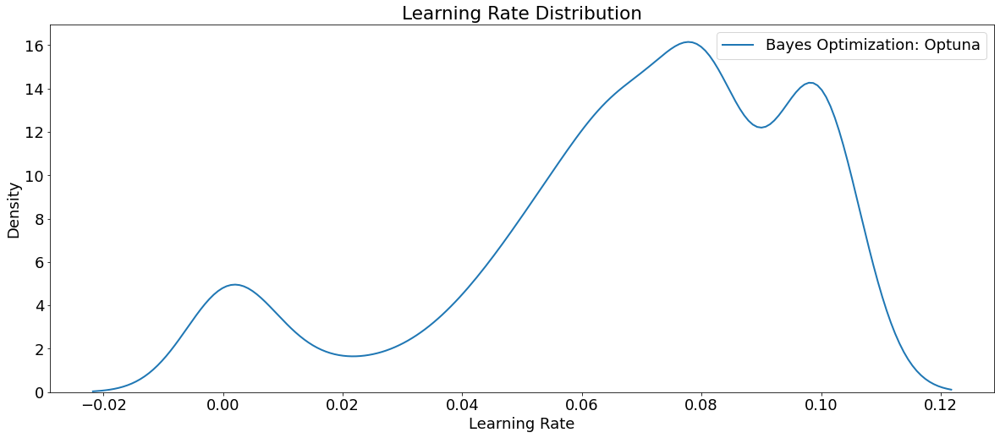

In [ ]:
# Density plots of the learning rate distributions
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna',
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); plt.title('Learning Rate Distribution');
plt.show()

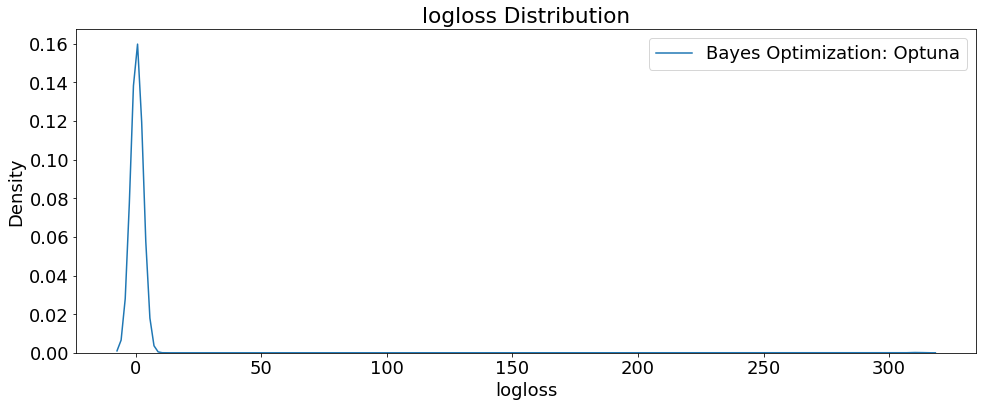

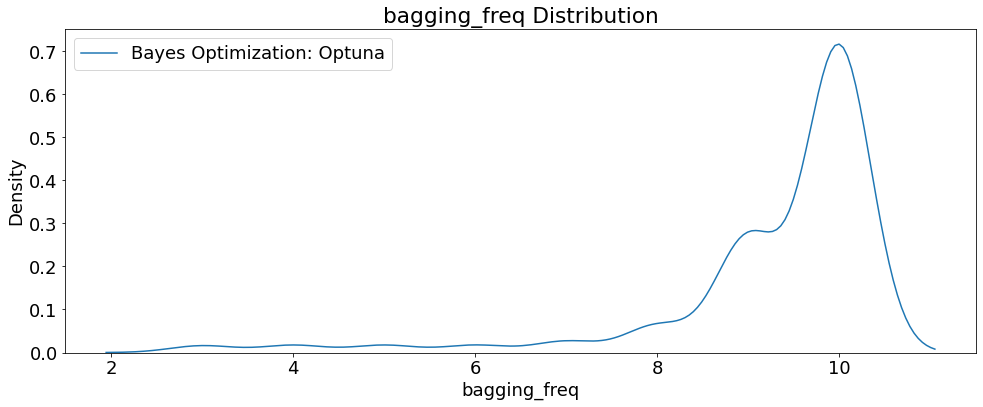

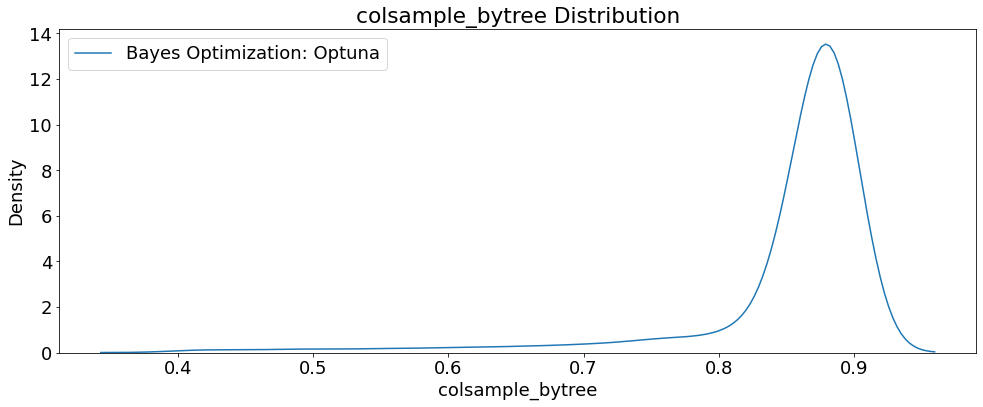

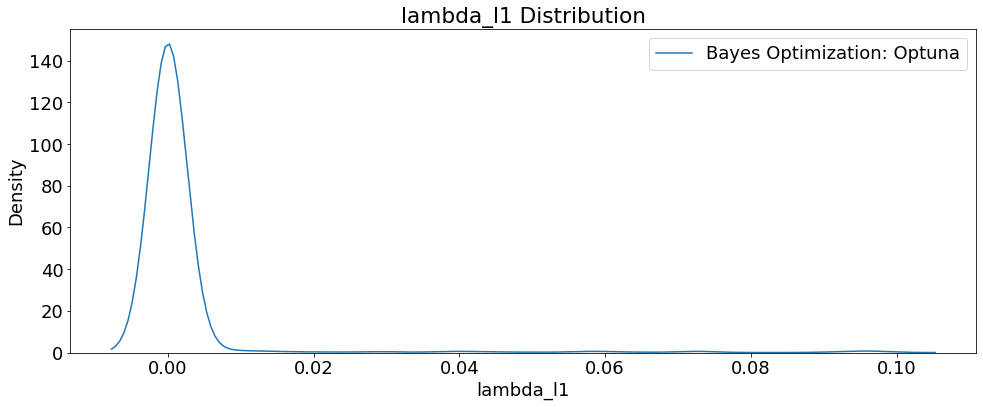

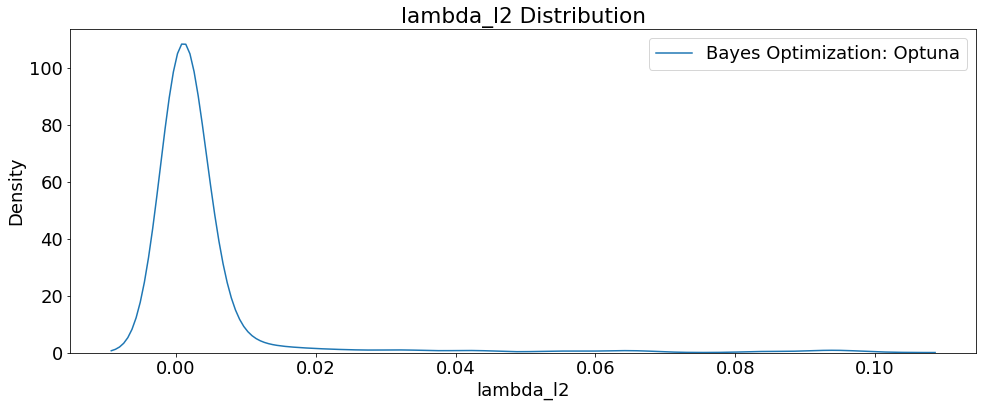

...

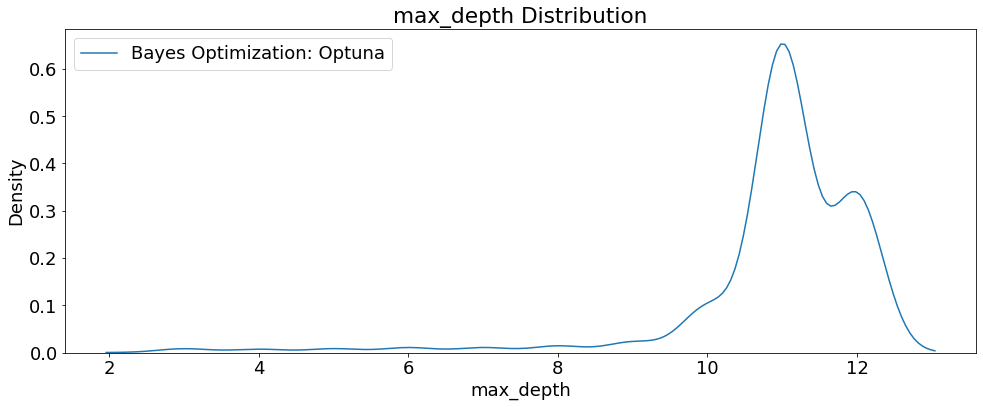

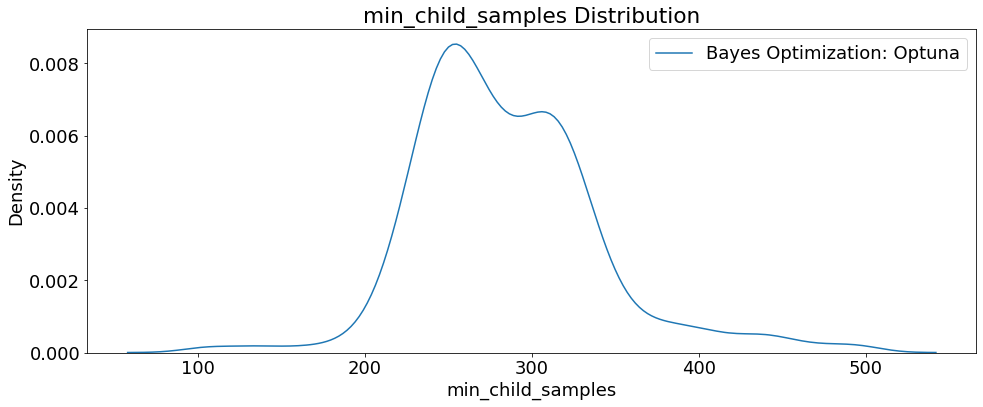

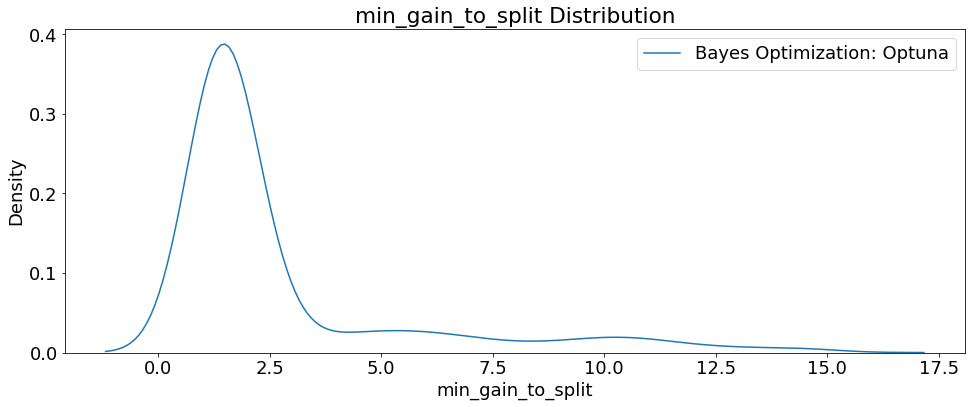

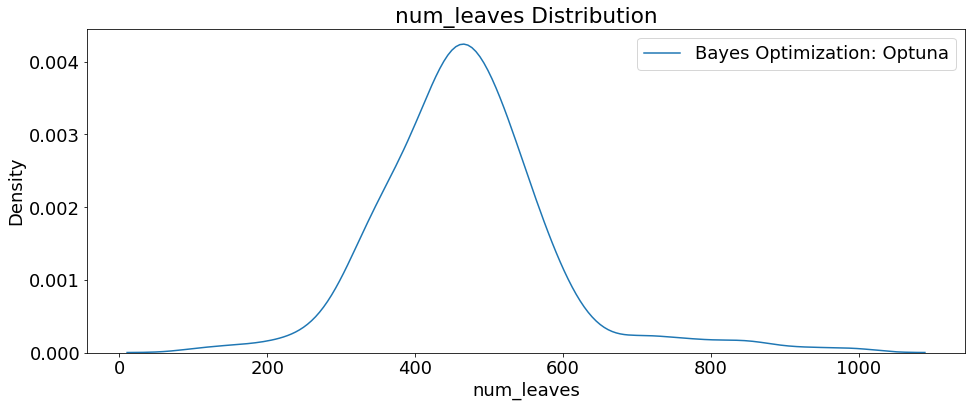

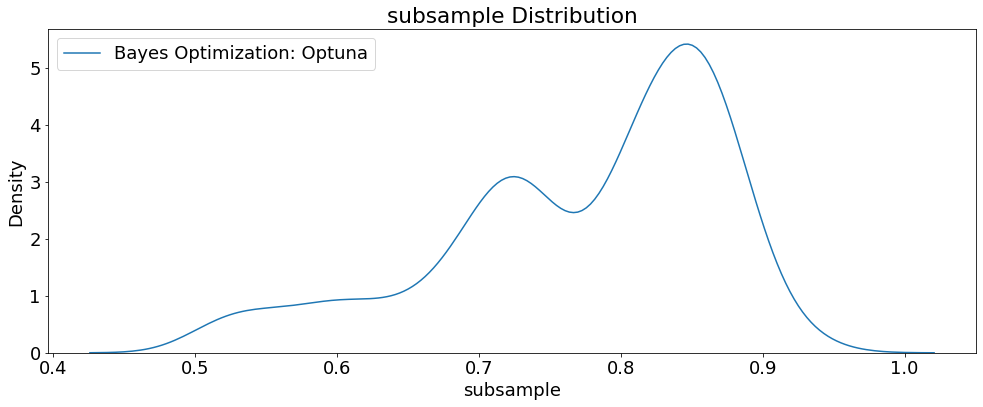

In [ ]:
# Create plots of Hyperparameters that are numeric
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration', 'n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

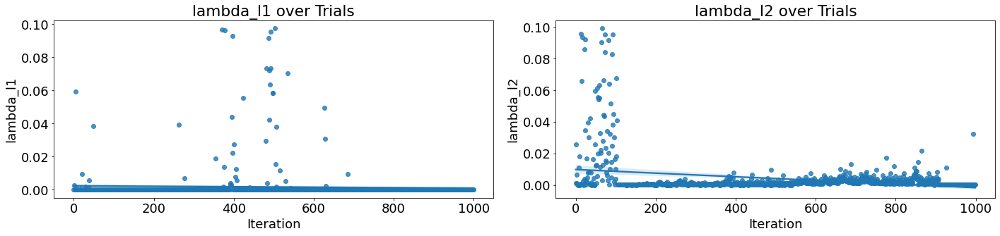

In [ ]:
# Scatterplot of regularization hyperparameters)
fig, axs = plt.subplots(1, 2, figsize=(20,5))
i = 0
for i, hpo in enumerate(['lambda_l1', 'lambda_l2']):
    # Scatterplot
    sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
    axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),
               title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_lightGBM_Upsampling_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_lightGBM_Upsampling_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params
params['random_state'] = seed_value
params['metric'] = 'binary_error'
params

{'n_estimators': 400,
 'learning_rate': 0.09968311861639294,
 'num_leaves': 500,
 'bagging_freq': 9,
 'subsample': 0.8992734856248441,
 'colsample_bytree': 0.878277507693008,
 'max_depth': 12,
 'lambda_l1': 5.255903820573677e-08,
 'lambda_l2': 0.005095957109154312,
 'min_gain_to_split': 1.0062350795323771,
 'min_child_samples': 250,
 'random_state': 42,
 'metric': 'binary_error'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define label and features
train_label = trainDF[['loan_status']]

# Remove target
train_features = trainDF.drop(columns = ['loan_status'])

# Create test features
test_features = testDF.drop(columns = ['loan_status'])

In [ ]:
# Re-create the best model and train on the training data
best_model = lgb.LGBMClassifier(boosting_type='gbdt',
                                device='gpu',
                                gpu_platform_id=0,
                                gpu_device_id=0,
                                verbosity=-1,
                                **params)

# Fit the model
best_model.fit(train_features, train_label.values.ravel())

# Save model
Pkl_Filename = 'lightGBM_Upsampling_Optuna_trials1000_GPU.pkl'

with open(Pkl_Filename, 'wb') as file:
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('lightGBM_Upsampling_Optuna_trials1000_GPU.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for lightGBM HPO Upsampling 1000 GPU trials')
# Predict based on training
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)
print('\n')
print('Classification Report: Train')
clf_rpt = classification_report(y_train, y_train_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix: Train')
print(confusion_matrix(y_train, y_train_pred))
print('\n')
print('Classification Report: Test')
clf_rpt = classification_report(y_test, y_test_pred)
print(clf_rpt)
print('\n')
print('Confusion matrix: Test')
print(confusion_matrix(y_test, y_test_pred))
print('\n')
print('Accuracy score: train: %.3f, test: %.3f' % (
        accuracy_score(y_train, y_train_pred),
        accuracy_score(y_test, y_test_pred)))
print('Precision score: train: %.3f, test: %.3f' % (
        precision_score(y_train, y_train_pred),
        precision_score(y_test, y_test_pred)))
print('Recall score: train: %.3f, test: %.3f' % (
        recall_score(y_train, y_train_pred),
        recall_score(y_test, y_test_pred)))
print('F1 score: train: %.3f, test: %.3f' % (
        f1_score(y_train, y_train_pred),
        f1_score(y_test, y_test_pred)))


Model Metrics for lightGBM HPO Upsampling 1000 GPU trials


Classification Report: Train
              precision    recall  f1-score   support

           0       0.98      1.00      0.99   1511066
           1       1.00      0.98      0.99   1511066

    accuracy                           0.99   3022132
   macro avg       0.99      0.99      0.99   3022132
weighted avg       0.99      0.99      0.99   3022132



Confusion matrix: Train
[[1509224    1842]
 [  25073 1485993]]


Classification Report: Test
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    377848
           1       0.98      0.92      0.95     54625

    accuracy                           0.99    432473
   macro avg       0.98      0.96      0.97    432473
weighted avg       0.99      0.99      0.99    432473



Confusion matrix: Test
[[376602   1246]
 [  4166  50459]]


Accuracy score: train: 0.991, test: 0.987
Precision score: train: 0.999, test: 0.976
Recall score: 

In [ ]:
# Evaluate on the testing data
print('The best model from optimization scores {:.5f} Accuracy on the test set.'.format(accuracy_score(y_test,
                                                                                                       y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 0.98749 Accuracy on the test set.
This was achieved using these conditions:
iteration                                   843
logloss                                0.008495
datetime_start       2022-11-09 11:56:59.005979
datetime_complete    2022-11-09 12:00:17.672499
duration                 0 days 00:03:18.666520
bagging_freq                                  9
colsample_bytree                       0.878278
lambda_l1                                   0.0
lambda_l2                              0.005096
learning_rate                          0.099683
max_depth                                    12
min_child_samples                           250
min_gain_to_split                      1.006235
n_estimators                                400
num_leaves                                  500
subsample                              0.899273
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations


In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(train_features)

<Figure size 640x480 with 0 Axes>

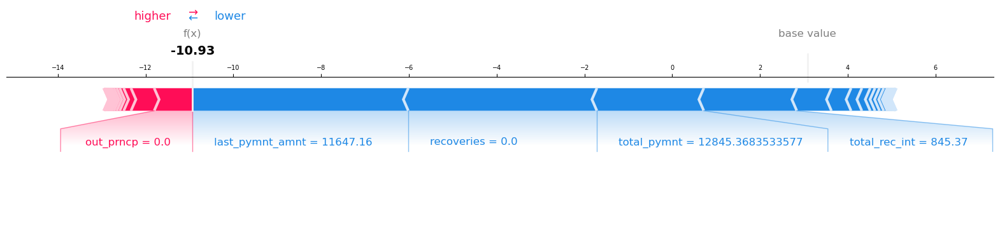

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 7})
fig = plt.figure()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], train_features.iloc[0,:],
                show=False, matplotlib=True).savefig('lightGBM_Upsampling_Optuna_1000_GPU_ShapForcePlot_TrainSet.png',
                                                     dpi=my_dpi*10*10,
                                                     bbox_inches='tight');

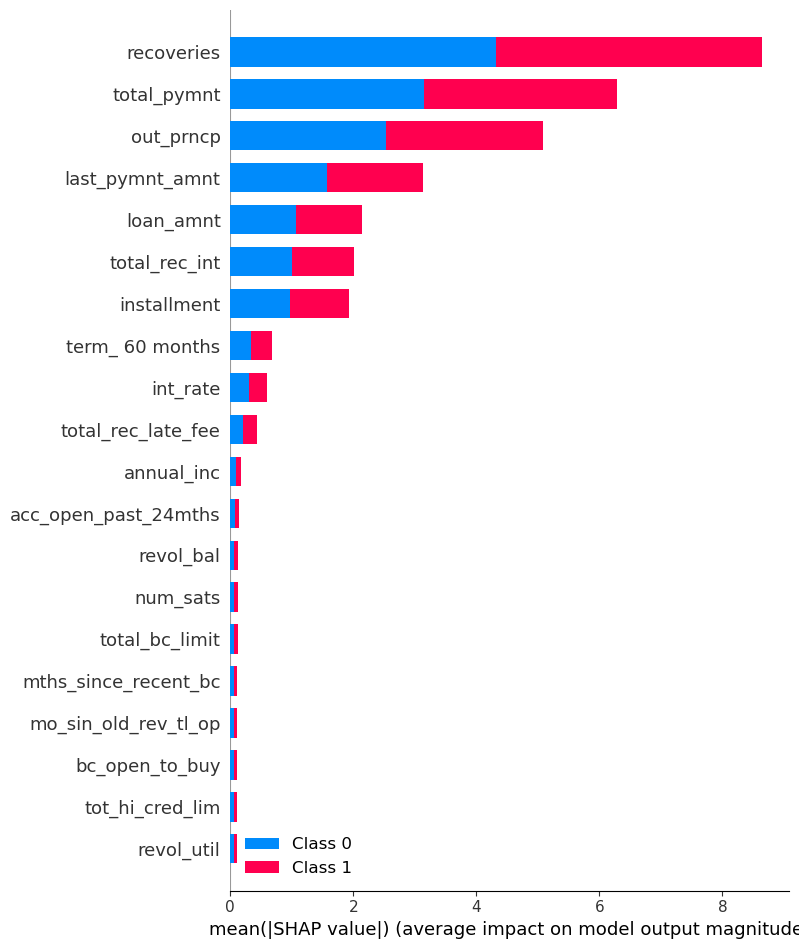

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('lightGBM_Upsampling_Optuna_1000_GPU_ShapSummary_TrainSet.png',
            dpi=my_dpi*10*10, bbox_inches='tight');

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 640x480 with 0 Axes>

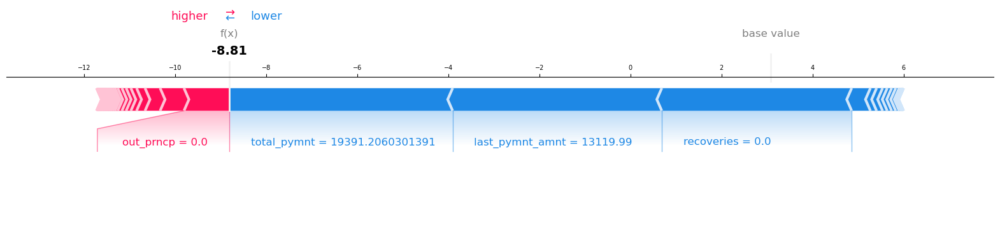

In [ ]:
# Visualize the first prediction's explanation
fig = plt.figure()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], test_features.iloc[0,:],
                show=False, matplotlib=True).savefig('lightGBM_Upsampling_Optuna_1000_GPU_ShapForcePlot_TestSet.png',
                                                     dpi=my_dpi*10*10,
                                                     bbox_inches='tight');

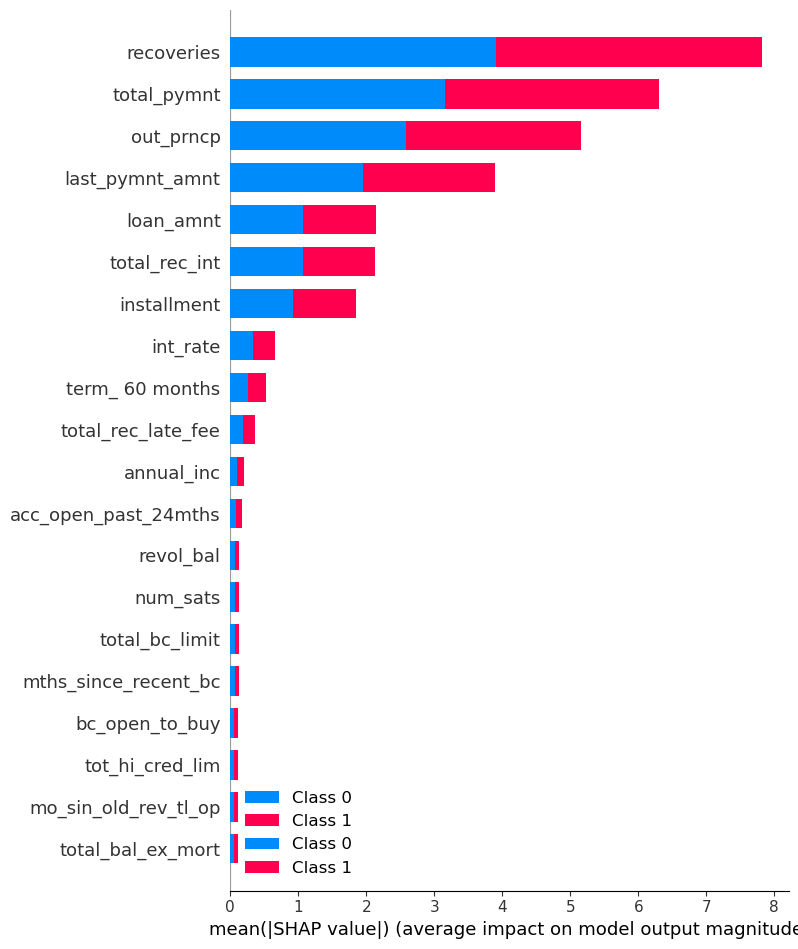

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('lightGBM_Upsampling_Optuna_1000_GPU_ShapSummary_TestSet.png',
            dpi=my_dpi*10*10, bbox_inches='tight');

In [ ]:
# Model metrics with Eli5
# Compute permutation feature importance
perm_importance = PermutationImportance(best_model,
                                        random_state=seed_value).fit(test_features,
                                                                     y_test)

In [ ]:
# Get the weights
X_test1 = pd.DataFrame(test_features, columns=test_features.columns)

# Store feature weights in an object
html_obj = eli5.show_weights(perm_importance,
                             feature_names=X_test1.columns.tolist())

# Write feature weights html object to a file
with open(r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Upsampling_Optuna_1000_GPU_WeightsFeatures.htm',
          'wb') as f:
    f.write(html_obj.data.encode('UTF-8'))

# Open the stored feature weights HTML file
url = r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Upsampling_Optuna_1000_GPU_WeightsFeatures.htm'
webbrowser.open(url, new=2)

html_obj

Weight,Feature
0.2488 ± 0.0010,out_prncp
0.2400 ± 0.0006,total_pymnt
0.0668 ± 0.0002,recoveries
0.0664 ± 0.0005,loan_amnt
0.0536 ± 0.0002,installment
0.0472 ± 0.0004,last_pymnt_amnt
0.0232 ± 0.0003,total_rec_int
0.0158 ± 0.0003,int_rate
0.0027 ± 0.0002,total_rec_late_fee
0.0003 ± 0.0001,term_ 60 months


In [ ]:
# Explain weights
explanation = eli5.explain_weights_sklearn(perm_importance,
                                           feature_names=X_test1.columns.tolist())
exp = format_as_dataframe(explanation)

# Write processed data to csv
exp.to_csv('best_bayes_Upsampling_Optuna_1000_GPU_WeightsExplain.csv',
           index=False)
exp

,feature,weight,std
0,out_prncp,0.248844,0.000493
1,total_pymnt,0.239985,0.000317
2,recoveries,0.066753,0.000106
3,loan_amnt,0.066444,0.000246
4,installment,0.053564,0.000083
5,last_pymnt_amnt,0.047178,0.000216
6,total_rec_int,0.023249,0.000131
7,int_rate,0.015755,0.000130
8,total_rec_late_fee,0.002742,0.000090
9,term_ 60 months,0.000297,0.000039


In [ ]:
# Show prediction
html_obj2 = show_prediction(best_model, test_features.iloc[1],
                            show_feature_values=True)

# Write show prediction html object to a file
with open(r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Upsampling_Optuna_1000_GPU_Prediction.htm',
          'wb') as f:
    f.write(html_obj2.data.encode('UTF-8'))

# Open the show prediction stored HTML file
url2 = r'/content/drive/MyDrive/LoanStatus/Python/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Upsampling_Optuna_1000_GPU_Prediction.htm'
webbrowser.open(url2, new=2)

html_obj2

In [ ]:
# LIME for model explanations
X_train1 = pd.DataFrame(X_train, columns=trainDF.columns)

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train1.columns,
    class_names=['current', 'default'],
    mode='classification')

exp = explainer.explain_instance(
    data_row=X_train.iloc[1],
    predict_fn=best_model.predict_proba)
exp.save_to_file('best_bayes_Upsampling_Optuna_1000_GPU_LIME_Train.html')
exp.show_in_notebook()

In [ ]:
X_test1 = pd.DataFrame(X_test, columns=testDF.columns)

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_test),
    feature_names=X_test1.columns,
    class_names=['current', 'default'],
    mode='classification')

exp = explainer.explain_instance(
    data_row=X_test.iloc[1],
    predict_fn=best_model.predict_proba)
exp.save_to_file('best_bayes_Upsampling_Optuna_1000_GPU_LIME_Test.html')
exp.show_in_notebook()